# Remove Bands in fMOST Brain

Image writing may be uncommented.

by Zuohan Zhao, 2022

## Utils

In [1]:
import os
import math
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tifffile import imread, imwrite
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm, classes, xlab='Predict Label', ylab='Actual Label', title='Confusion Matrix'):
    '''
    plt.figure() by yourself
    :param cm:
    :param classes:
    :param xlab:
    :param ylab:
    :param title:
    :return:
    '''

    ind_array = np.arange(len(classes))
    x, y = np.meshgrid(ind_array, ind_array)
    for x_val, y_val in zip(x.flatten(), y.flatten()):
        c = cm[y_val][x_val]
        plt.text(x_val, y_val, "%0.2f%%" % (c,), color='red', fontsize=15, va='center', ha='center')

    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.binary)
    plt.title(title)
    plt.colorbar()
    xlocations = np.array(range(len(classes)))
    plt.xticks(xlocations, classes, rotation=90)
    plt.yticks(xlocations, classes)
    plt.ylabel(ylab)
    plt.xlabel(xlab)

    # offset the tick
    tick_marks = np.array(range(len(classes))) + 0.5
    plt.gca().set_xticks(tick_marks, minor=True)
    plt.gca().set_yticks(tick_marks, minor=True)
    plt.gca().xaxis.set_ticks_position('none')
    plt.gca().yaxis.set_ticks_position('none')
    plt.grid(True, which='minor', linestyle='-')
    plt.gcf().subplots_adjust(bottom=0.15)


## Problem Demonstration

Coronal and Horizontal 8bit projection of raw images.

### Coronal projection

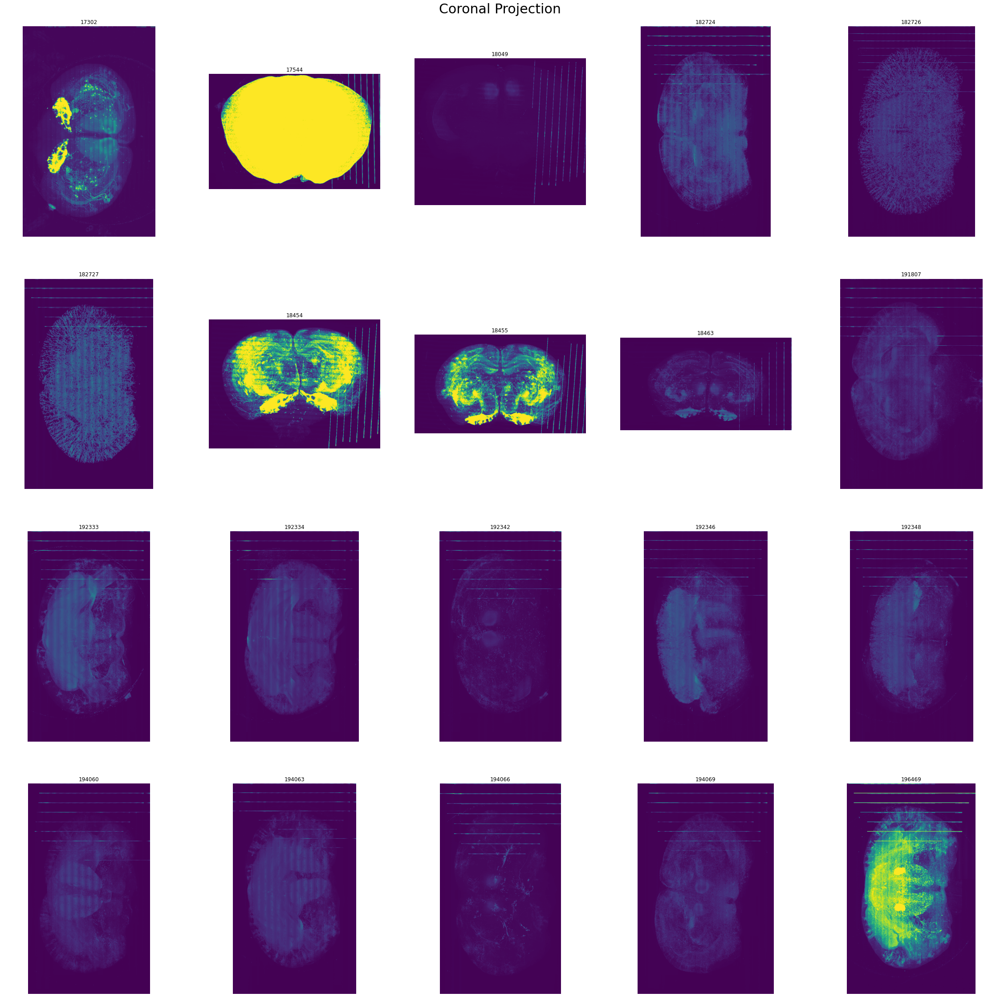

In [42]:
in_dir = '../results/lowestRes'
cor_proj_dir = '../results/preprocess/rawCoronalProjection'
os.makedirs(cor_proj_dir, exist_ok=True)

cols = 5
rows = math.ceil(len(os.listdir(in_dir)) / cols)
fig = plt.figure(figsize=(40, 40))
plt.axis('off')
plt.title('Coronal Projection', {'fontsize': 30}, pad=30)

for i, brain in enumerate(os.listdir(in_dir)):
    img = imread(os.path.join(in_dir, brain))
    cor = cv2.convertScaleAbs(img.max(axis=0), alpha=255.0 / img.max())
    # imwrite(os.path.join(cor_proj_dir, brain), cor)
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(cor)
    plt.axis('off')
    plt.title(brain.strip('.tif'))

### Horizontal projection

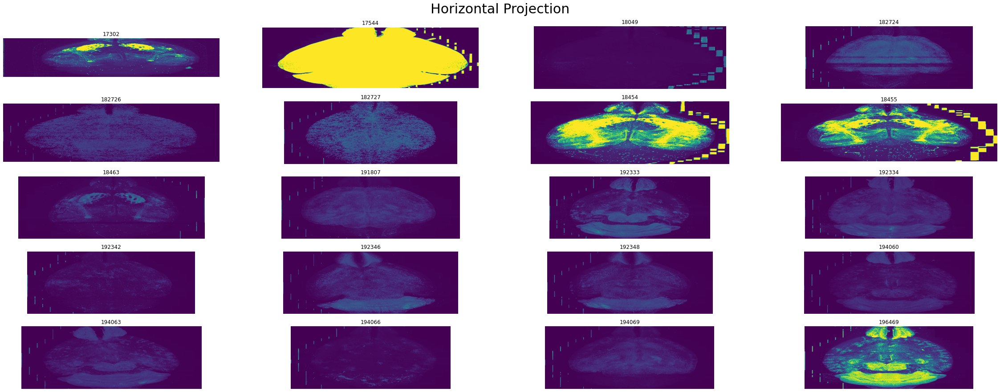

In [41]:
in_dir = '../results/lowestRes'
hor_proj_dir = '../results/preprocess/rawHorizontalProjection'
os.makedirs(hor_proj_dir, exist_ok=True)

old = ['17544', '18049', '18454', '18455', '18463']

cols = 4
rows = math.ceil(len(os.listdir(in_dir)) / cols)
fig = plt.figure(figsize=(40, 15))
plt.axis('off')
plt.title('Horizontal Projection', {'fontsize': 30}, pad=30)

for i, brain in enumerate(os.listdir(in_dir)):
    img = imread(os.path.join(in_dir, brain))
    hor = cv2.convertScaleAbs(img.max(axis=1 if brain.strip('.tif') in old else 2), alpha=255.0 / img.max())
    # imwrite(os.path.join(hor_proj_dir, brain), hor)
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(hor)
    plt.axis('off')
    plt.title(brain.strip('.tif'))

## Algorithm 1: Hough Transform

This method is relatively complicated, and can miss some bands, but with proper params can be rather safe and controllable, cause it only detects lines with very clear definition. Also, it processes coronal images directly, which is rather authentic compared with other views as it's directly acquired in experiment.

Steps:
1. Closing (Smoothing)
2. Sobel
3. Canny
4. Closing (Filling holes)
5. Hough Lines Probability Transform
6. Filter lines based on orientation & distance to center
7. Draw lines (extending length & width)
8. Closing (Filling gaps over z direction)

In [35]:
def get_band_mask(img, **kwargs):
    '''
    get band mask
    :param img: 3d stack numpy array (z,y,x)
    :return: the 8bit binary mask of the bands
    '''

    stack = []
    SE1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kwargs['SE1'],)*2)
    SE2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kwargs['SE2'],)*2)
    SE3 = cv2.getStructuringElement(cv2.MORPH_RECT, (1, kwargs['SE3']))
    gk = kwargs['sigma'] * 3
    if gk % 2 == 0:
        gk += 1
    for sl in img:
        # Closing
        closed = cv2.morphologyEx(sl, cv2.MORPH_CLOSE, SE1)
        closed = cv2.GaussianBlur(closed, (gk,) * 2, kwargs['sigma'])
        # Canny
        dx = cv2.Sobel(closed, cv2.CV_32F, 1, 0)
        dy = cv2.Sobel(closed, cv2.CV_32F, 0, 1)
        m = np.hypot(dx, dy).max()
        dx = (dx * 32767 / m).astype(np.int16)
        dy = (dy * 32767 / m).astype(np.int16)
        m = np.hypot(dx, dy).max()
        canny = cv2.Canny(dx, dy, kwargs['cannyMin'] * m, kwargs['cannyMax'] * m, L2gradient=True)
        stack.append(canny)
    stack = np.stack(stack)

    # get all bands as lines
    all_lines = []
    for i, sl in enumerate(stack):
        # Closing
        closed = cv2.morphologyEx(sl, cv2.MORPH_CLOSE, SE2)
        # Hough Line Transform P
        lines = cv2.HoughLinesP(closed, kwargs['rho'], kwargs['theta'],
                                kwargs['threshold'], minLineLength=kwargs['minLineLength'], maxLineGap=kwargs['maxLineGap'])
        if lines is not None:
            # reshape lines so that it looks like:
            # [ [[x1, y1], [x2, y2]], .. ]
            # and append the slice info so that it looks like
            # [ [[x1, y1, z1], [x2, y2, z2]], .. ]
            lines = np.append(lines.reshape(-1, 2, 2), np.ones([len(lines), 2, 1], dtype=np.int32) * i, axis=2)
            all_lines.extend(lines)

    # filter lines based on distance to center and orientation
    fct = [1, 1, kwargs['zThickness']]
    ct = np.flip(img.shape) * fct / 2
    def pass_dist(p1, p2):
        _p1 = p1 * fct
        _p2 = p2 * fct
        return np.linalg.norm(np.cross(_p2 - ct, _p1 - ct)) / np.linalg.norm(_p2 - _p1) >= kwargs['minDist']

    def pass_angle(p1, p2):
        def get_angle(v1, v2):
            inner = np.inner(v1, v2)
            norms = np.linalg.norm(v1) * np.linalg.norm(v2)
            cos = abs(inner / norms)
            rad = np.arccos(np.clip(cos, -1.0, 1.0))
            deg = np.rad2deg(rad)
            return abs(deg)
        if ct[0] > ct[1]:
            return get_angle(p1 - p2, np.array([0, 1, 0])) <= kwargs['angleLim']
        else:
            return get_angle(p1 - p2, np.array([1, 0, 0])) <= kwargs['angleLim']

    filtered_lines = [line for line in all_lines if pass_angle(*line) and pass_dist(*line)]

    # draw the mask
    stack = np.zeros(stack.shape, dtype=np.uint8)
    for p1, p2 in filtered_lines:
        _p1 = p1[:2]
        _p2 = p2[:2]
        d = _p2 - _p1
        _p2 = _p2 + d * kwargs['extendRatio']
        _p1 = _p1 - d * kwargs['extendRatio']
        cv2.line(stack[p1[2]], _p1.astype('int'), _p2.astype('int'), 255, kwargs['lineWidth'])

    # cross z closing
    stack = stack.reshape(stack.shape[0], -1)
    stack = cv2.morphologyEx(stack, cv2.MORPH_CLOSE, SE3)
    stack = stack.reshape(img.shape)

    return stack


### Batch Trials

In [37]:
# directories
in_dir = '../results/lowestRes'
mask_dir = '../results/preprocess/hough/bandMaskStack'
remove_dir = '../results/preprocess/hough/removedStack'
band_proj_dir = '../results/preprocess/hough/bandProjection'
remove_proj_dir = '../results/preprocess/hough/removedProjection'
os.makedirs(mask_dir, exist_ok=True)
os.makedirs(remove_dir, exist_ok=True)
os.makedirs(band_proj_dir, exist_ok=True)
os.makedirs(remove_proj_dir, exist_ok=True)

for brain in os.listdir(in_dir):
    img = imread(os.path.join(in_dir, brain))

    # getting mask (Currently the BEST params)
    mask = get_band_mask(img, SE1=11, SE2=5, lineWidth=10, SE3=21, extendRatio=0.2, cannyMin=0.01, cannyMax=0.03, sigma=1,
                         # hough
                         rho=1, theta=np.pi / 180, threshold=100, minLineLength=100, maxLineGap=1,
                         # filter
                         minDist=300, angleLim=5, zThickness=2)

    # saving mask stack
    imwrite(os.path.join(mask_dir, brain), mask)

    # remove
    band = cv2.bitwise_or(img, img, mask=mask)
    remove = cv2.bitwise_or(img, img, mask=255-mask)

    # save removed
    imwrite(os.path.join(remove_dir, brain), remove)

    # get projections and save
    test = cv2.convertScaleAbs(remove.max(axis=0), alpha=255.0 / remove.max())
    imwrite(os.path.join(remove_proj_dir, brain), test)
    test = cv2.convertScaleAbs(band.max(axis=0), alpha=255.0 / band.max())
    imwrite(os.path.join(band_proj_dir, brain), test)
    print(brain, 'done.')

17302.tif done.
17544.tif done.
18049.tif done.
182724.tif done.
182726.tif done.
182727.tif done.
18454.tif done.
18455.tif done.
18463.tif done.
191807.tif done.
192333.tif done.
192334.tif done.
192342.tif done.
192346.tif done.
192348.tif done.
194060.tif done.
194063.tif done.
194066.tif done.
194069.tif done.
196469.tif done.


### Band-removed Images

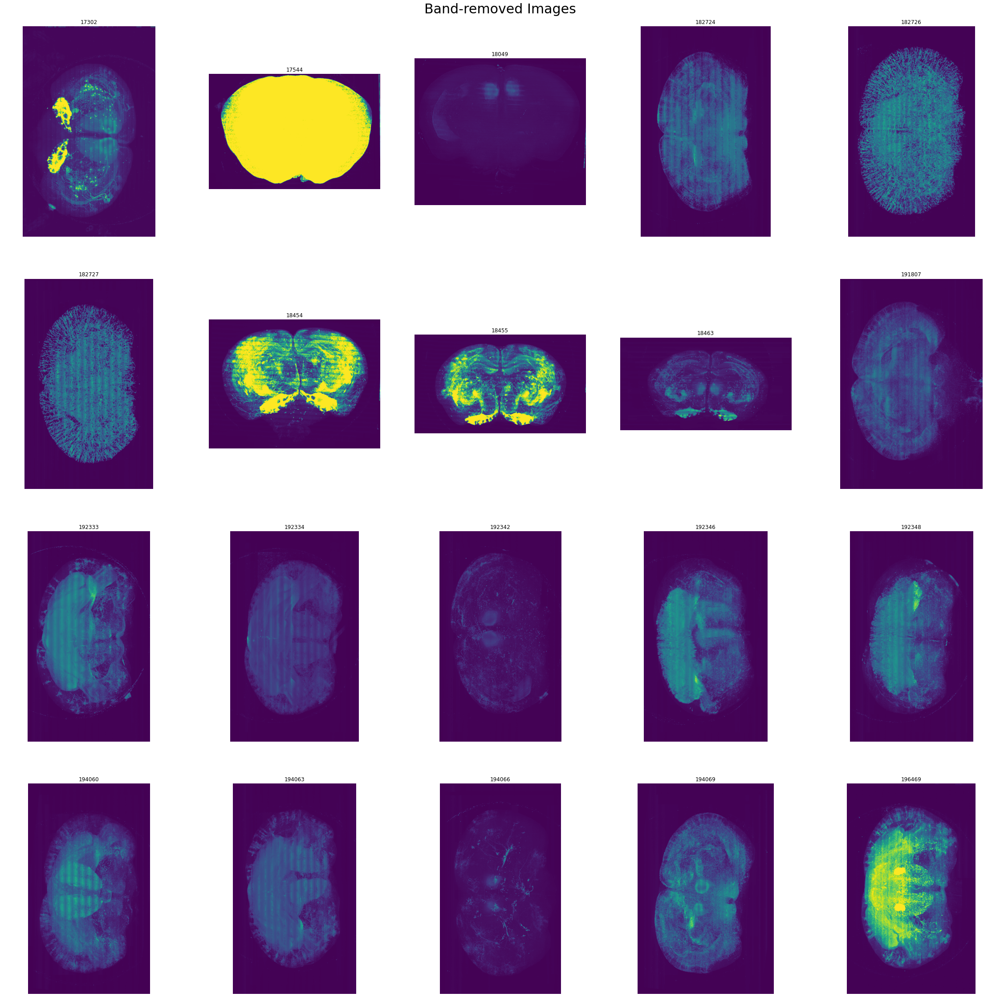

In [44]:
cols = 5
rows = math.ceil(len(os.listdir(in_dir)) / cols)
fig = plt.figure(figsize=(40, 40))
plt.axis('off')
plt.title('Band-removed Images', {'fontsize': 30}, pad=30)

for i, brain in enumerate(os.listdir(remove_proj_dir)):
    p = imread(os.path.join(remove_proj_dir, brain))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(p)
    plt.axis('off')
    plt.title(brain.strip('.tif'))

### Removed Band

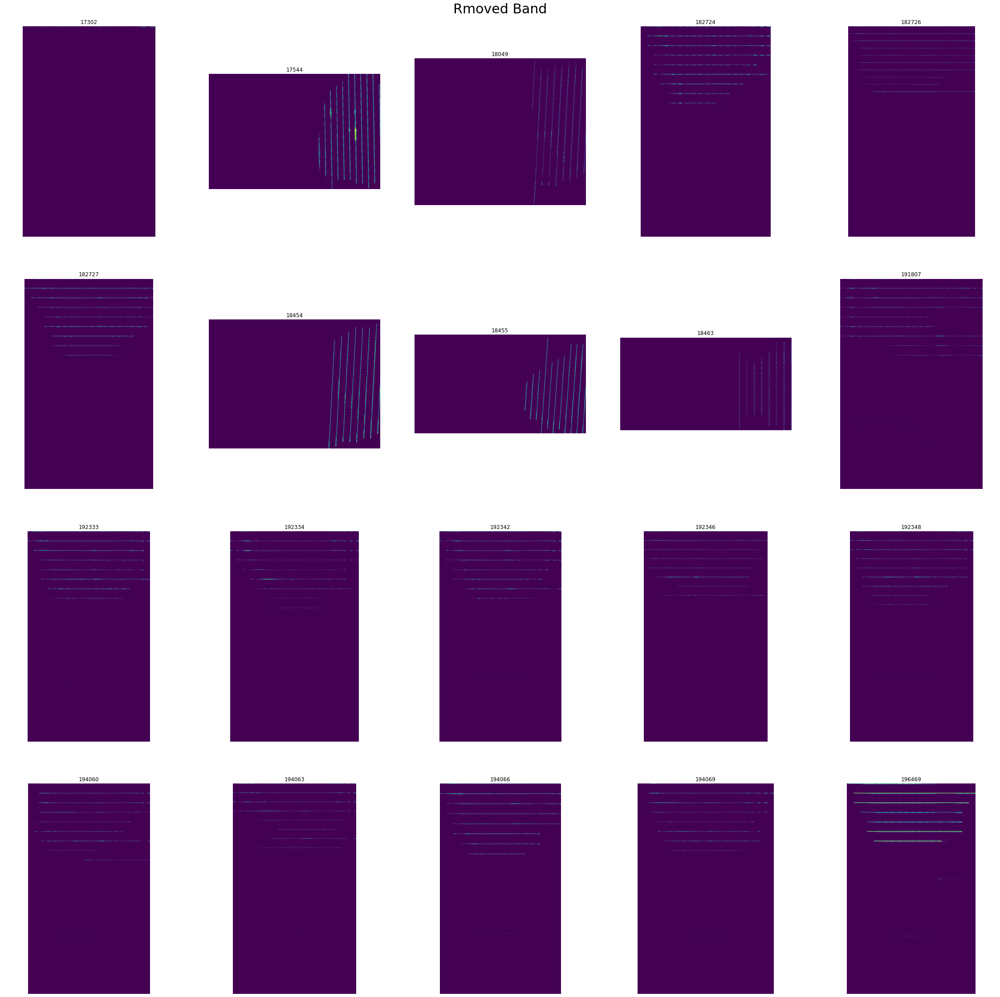

In [45]:
fig = plt.figure(figsize=(40, 40))
plt.axis('off')
plt.title('Rmoved Band', {'fontsize': 30}, pad=30)

for i, brain in enumerate(os.listdir(band_proj_dir)):
    p = imread(os.path.join(band_proj_dir, brain))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(p)
    plt.axis('off')
    plt.title(brain.strip('.tif'))

### Evaluation

Compare with manually acquired ground truth masks to validate this algorithm

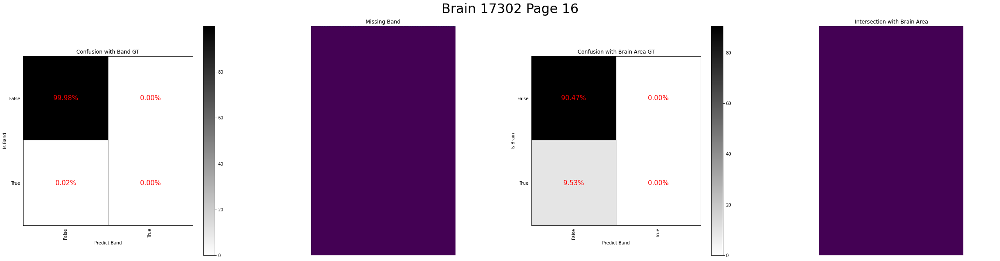

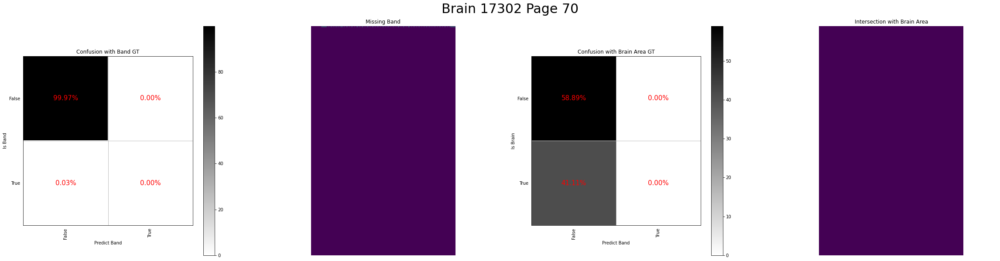

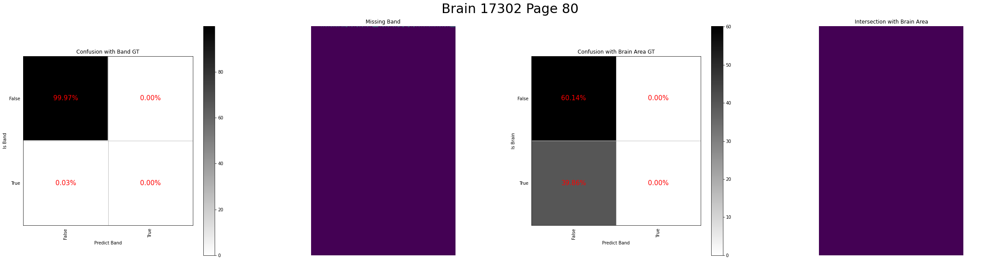

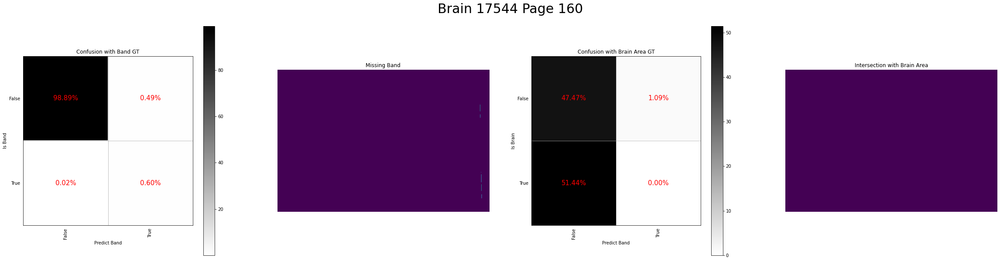

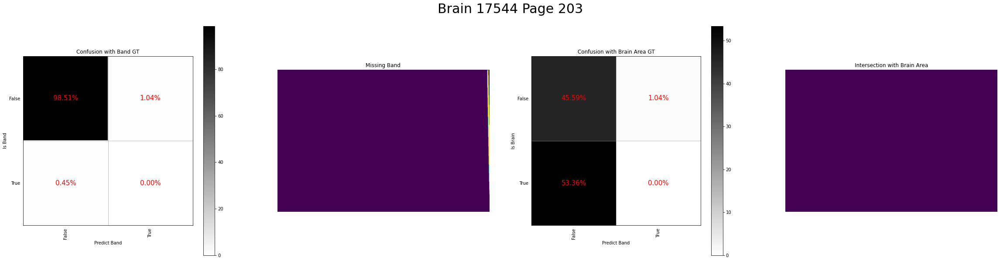

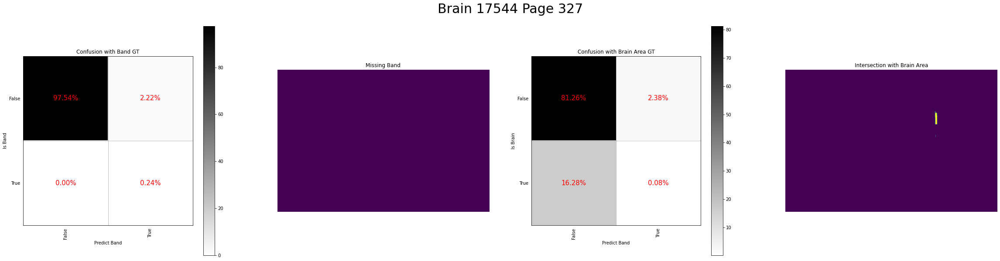

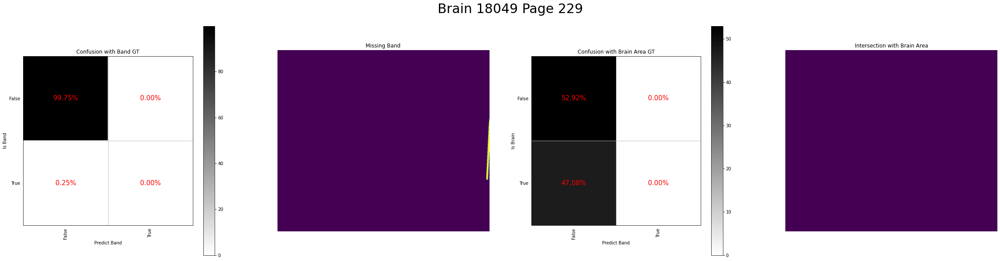

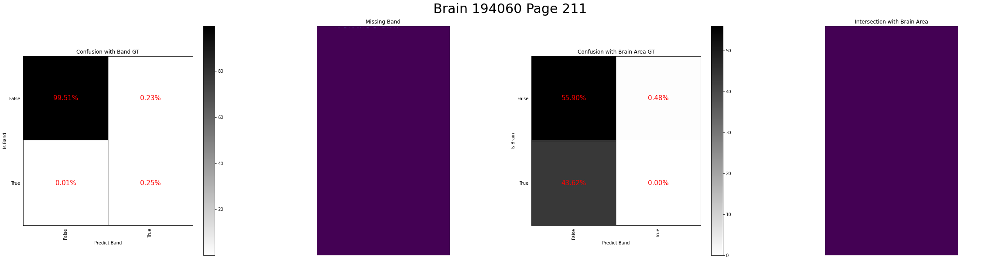

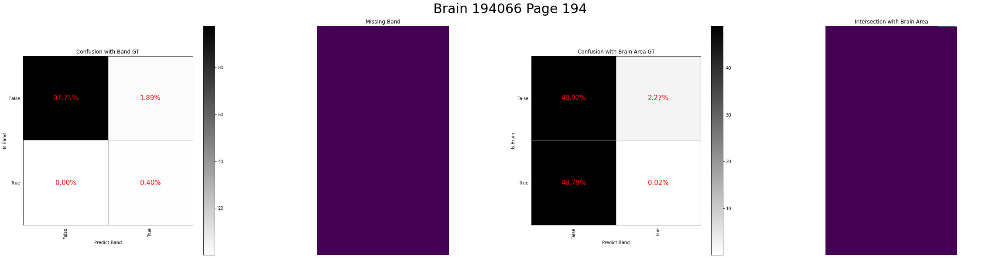

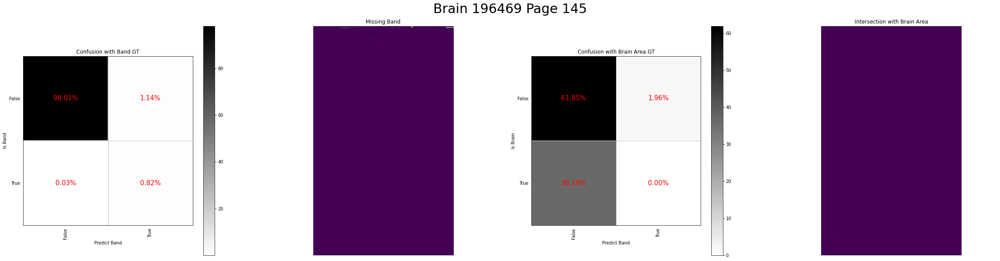

In [25]:
brain_gt_dir = '../../data/slice_fg_gt'
band_gt_dir = '../../data/slice_bd_gt'
my_mask_dir = '../results/preprocess/hough/bandMaskStack'
eval_dir = '../results/preprocess/hough/evaluation'
os.makedirs(eval_dir, exist_ok=True)

# band miss and foreground cross list
misses = []
errs = []
bds = []
hits = []

# per page evaluation
for brain in os.listdir(brain_gt_dir):
    id = brain.rstrip('.tif').split('-')[0]
    page = brain.rstrip('.tif').split('-')[1]
    fg = imread(os.path.join(brain_gt_dir, brain)).astype('bool')
    bd = imread(os.path.join(band_gt_dir, brain)).astype('bool')
    my_bd= imread(os.path.join(my_mask_dir, id + '.tif'), key=int(page) - 1).astype('bool')
    cm_bd = confusion_matrix(bd.reshape(-1), my_bd.reshape(-1))
    cm_fg = confusion_matrix(fg.reshape(-1), my_bd.reshape(-1))
    cm_bd = cm_bd * 100 / cm_bd.sum()
    cm_fg = cm_fg * 100 / cm_fg.sum()

    # plot
    fig = plt.figure(figsize=(40, 10))
    plt.title('Brain ' + id + ' Page ' + page, {'fontsize': 30}, pad=30)
    plt.axis('off')
    fig.add_subplot(1, 4, 1)
    plot_confusion_matrix(cm_bd, [False, True], 'Predict Band', 'Is Band', title='Confusion with Band GT')
    fig.add_subplot(1, 4, 2)
    plt.imshow(np.bitwise_and(bd, np.bitwise_not(my_bd)).astype('float'))
    plt.axis('off')
    plt.title('Missing Band')
    fig.add_subplot(1, 4, 3)
    plot_confusion_matrix(cm_fg, [False, True], 'Predict Band', 'Is Brain', title='Confusion with Brain Area GT')
    fig.add_subplot(1, 4, 4)
    plt.imshow(np.bitwise_and(fg, my_bd).astype('float'))
    plt.axis('off')
    plt.title('Intersection with Brain Area')
    # plt.savefig(os.path.join(eval_dir, brain.strip('.tif') + '.png'))

    misses.append(cm_bd[1][0])
    errs.append(cm_fg[1][1])
    bds.append(cm_bd[1][0] + cm_bd[1][1])
    hits.append(cm_bd[1][1])

    if cm_bd[1][0] >= 0.01 or cm_fg[1][1] >= 0.01:
        pass
    else:
        plt.close()

Sum up.

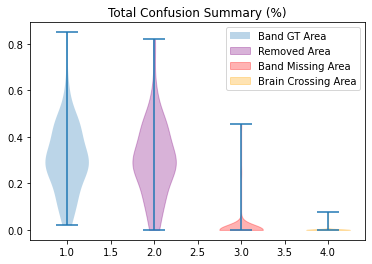

In [31]:
plt.figure()
violin = plt.violinplot([bds, hits, misses, errs])
violin['bodies'][1].set_color('purple')
violin['bodies'][2].set_color('red')
violin['bodies'][3].set_color('orange')
plt.title('Total Confusion Summary (%)')
plt.legend(['Band GT Area', 'Removed Area', 'Band Missing Area', 'Brain Crossing Area'])
plt.savefig(os.path.join(eval_dir, 'sum.png'))
plt.show()

## Algorithm 2: Morphological Operation
Instead of detecting and removing bands, this method tries to remove the band directly and extract the brain foreground. Usually, it's unstable for image slices, but max projection can make the foreground prominent enough.

Steps:
1. L2 projection to the horizontal plane
2. resize to 1000x1000
3. 10x10 closing (NOTE:bordertype)
4. 10x10 opening (NOTE:bordertype)
5. resize back & threshold based on percentile (fg=0.55 is mostly ok)

In [32]:
def masking(img, se1=21, se2=11, fg_ratio=.55):
    SE1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (se1,) * 2)
    SE2 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (se2,)*2)
    proj = np.linalg.norm(img, axis=2)
    proj = (proj * 65535 / proj.max()).astype('uint16')
    ori_shape = (img.shape[1], img.shape[0])
    ori_shape = proj.T.shape
    proj = cv2.resize(proj, (1000, 1000))
    proj = cv2.morphologyEx(proj, cv2.MORPH_OPEN, SE1, borderType=cv2.BORDER_CONSTANT, borderValue=0)
    proj = cv2.morphologyEx(proj, cv2.MORPH_CLOSE, SE1, borderType=cv2.BORDER_CONSTANT, borderValue=0)
    proj = cv2.resize(proj, ori_shape, cv2.INTER_AREA)
    min_diff = 1
    bst_t = None
    for i in range(65536):
        r = np.sum(proj > i) / (proj.shape[0] * proj.shape[1])
        if abs(r - fg_ratio) <= min_diff:
            min_diff = abs(r - fg_ratio)
            bst_t = i
        else:
            break
    proj = cv2.threshold(proj, bst_t, 65535, cv2.THRESH_BINARY)[1].astype('uint8')
    proj = cv2.morphologyEx(proj, cv2.MORPH_DILATE, SE2, borderType=cv2.BORDER_CONSTANT, borderValue=0)
    return proj

### Batch Trial

In [33]:
# directories
in_dir = '../results/lowestRes'
mask_dir = '../results/preprocess/morph/bandMaskStack'
remove_dir = '../results/preprocess/morph/removedStack'
band_proj_dir = '../results/preprocess/morph/bandProjection'
remove_proj_dir = '../results/preprocess/morph/removedProjection'
os.makedirs(mask_dir, exist_ok=True)
os.makedirs(remove_dir, exist_ok=True)
os.makedirs(band_proj_dir, exist_ok=True)
os.makedirs(remove_proj_dir, exist_ok=True)

for brain in os.listdir(in_dir):
    img = imread(os.path.join(in_dir, brain))

    # getting mask (Currently the BEST params)
    mask = masking(img)
    imwrite(os.path.join(mask_dir, brain), mask)

    # remove
    remove = cv2.bitwise_or(img, img, mask=np.stack((mask,)*img.shape[2], axis=2))
    band = cv2.bitwise_or(img, img, mask=np.stack((255-mask,)*img.shape[2], axis=2))

    # save removed
    imwrite(os.path.join(remove_dir, brain), remove)

    # get projections and save
    test = cv2.convertScaleAbs(remove.max(axis=0), alpha=255.0 / remove.max())
    imwrite(os.path.join(remove_proj_dir, brain), test)
    test = cv2.convertScaleAbs(band.max(axis=0), alpha=255.0 / band.max())
    imwrite(os.path.join(band_proj_dir, brain), test)
    print(brain, 'done.')

17302.tif done.
17544.tif done.
18049.tif done.
182724.tif done.
182726.tif done.
182727.tif done.
18454.tif done.
18455.tif done.
18463.tif done.
191807.tif done.
192333.tif done.
192334.tif done.
192342.tif done.
192346.tif done.
192348.tif done.
194060.tif done.
194063.tif done.
194066.tif done.
194069.tif done.
196469.tif done.


### Band-removed Images

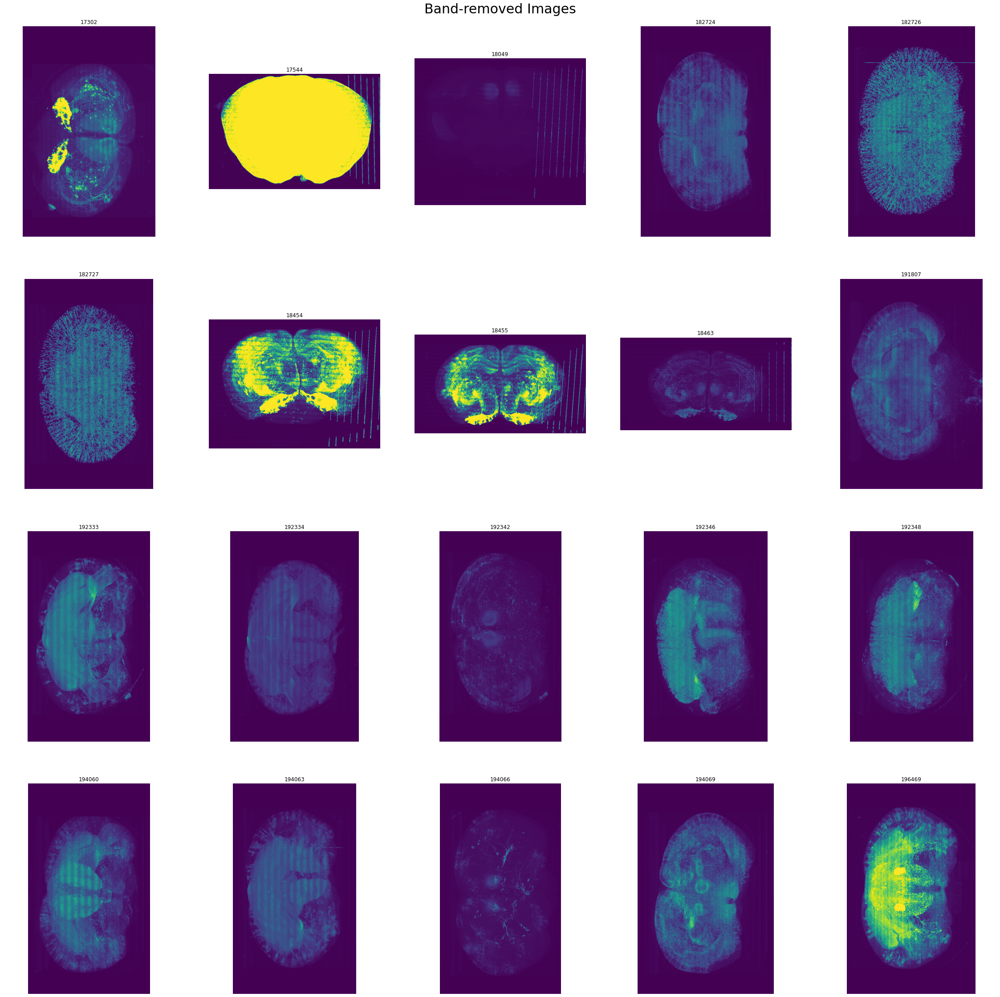

In [35]:
cols = 5
rows = math.ceil(len(os.listdir(in_dir)) / cols)
fig = plt.figure(figsize=(40, 40))
plt.axis('off')
plt.title('Band-removed Images', {'fontsize': 30}, pad=30)

for i, brain in enumerate(os.listdir(remove_proj_dir)):
    p = imread(os.path.join(remove_proj_dir, brain))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(p)
    plt.axis('off')
    plt.title(brain.strip('.tif'))

### Removed Band

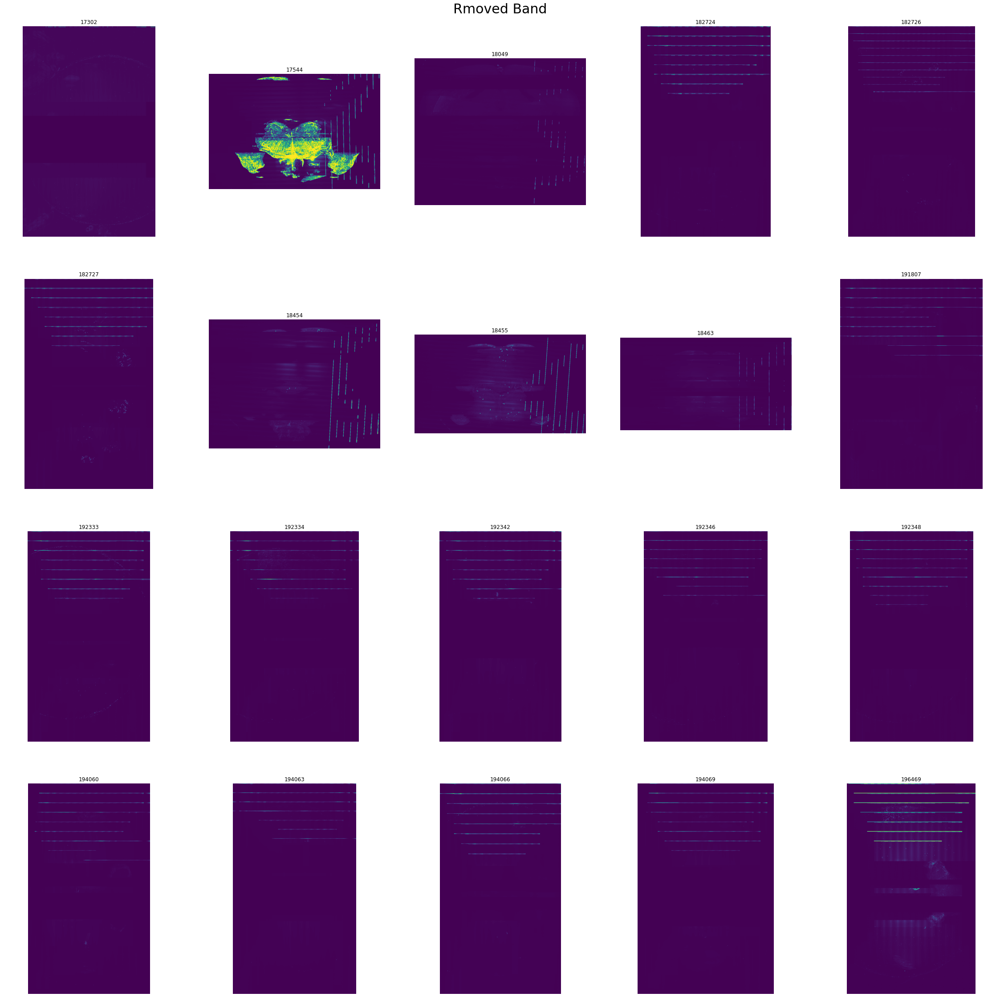

In [36]:
fig = plt.figure(figsize=(40, 40))
plt.axis('off')
plt.title('Rmoved Band', {'fontsize': 30}, pad=30)

for i, brain in enumerate(os.listdir(band_proj_dir)):
    p = imread(os.path.join(band_proj_dir, brain))
    fig.add_subplot(rows, cols, i+1)
    plt.imshow(p)
    plt.axis('off')
    plt.title(brain.strip('.tif'))

### Evaluation

Clearly, the early brains doesn't perform as expected, so they are not considered here.

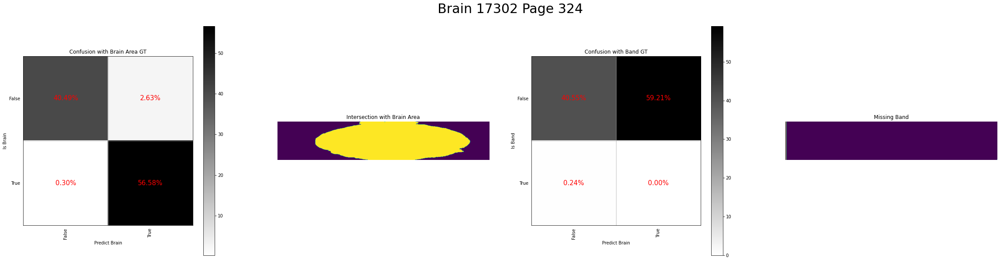

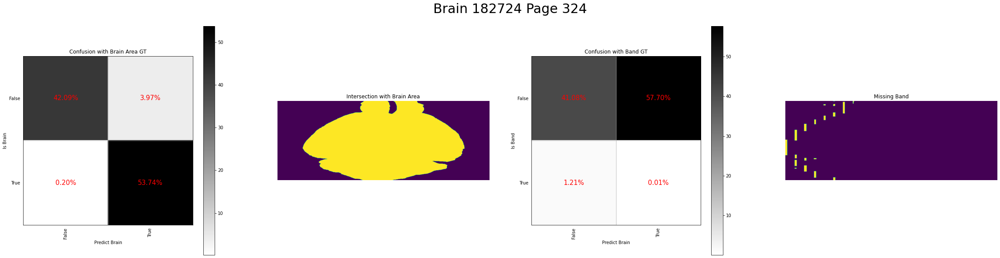

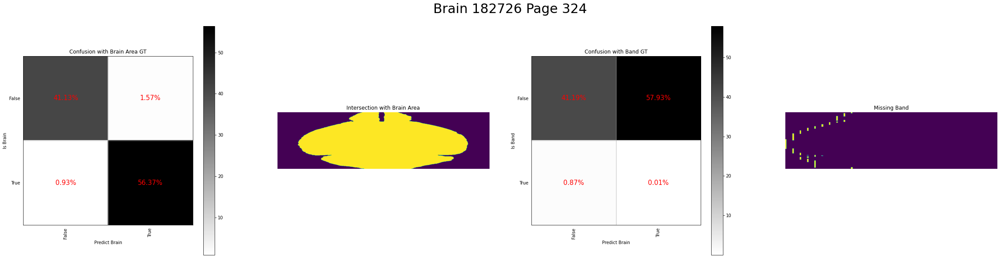

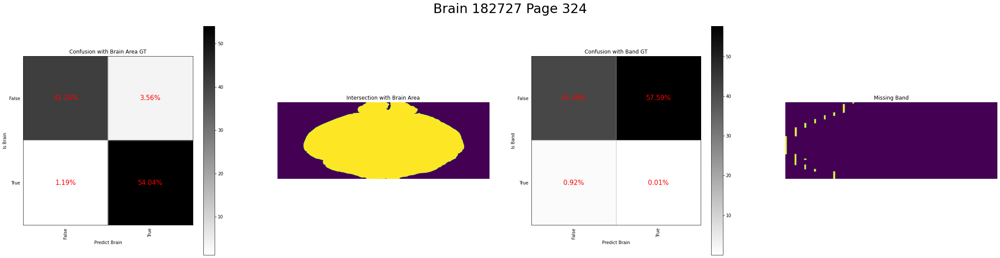

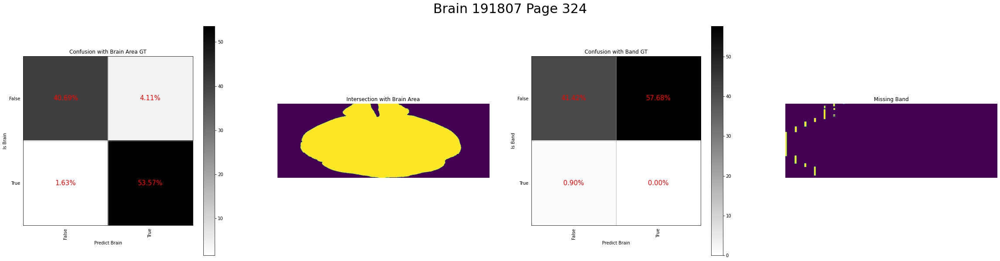

...

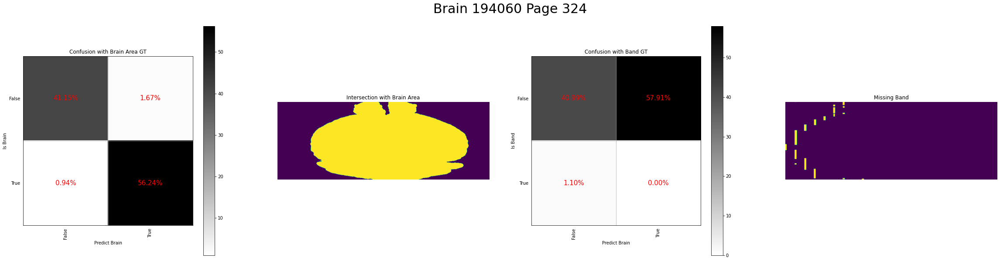

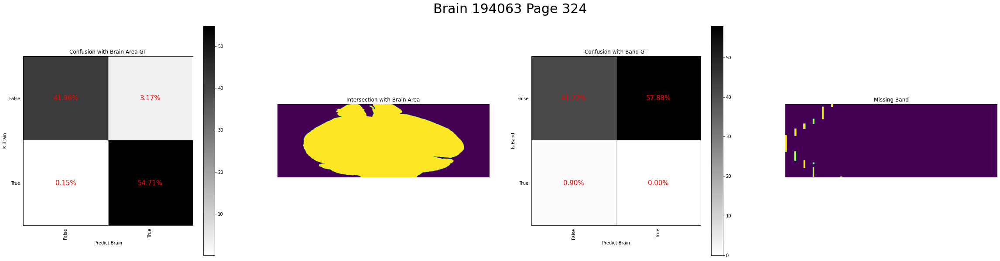

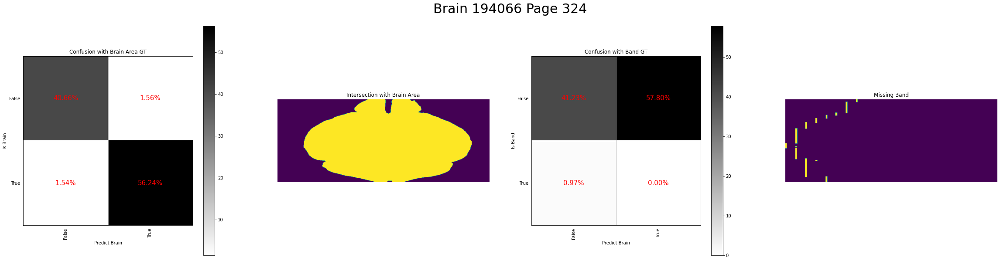

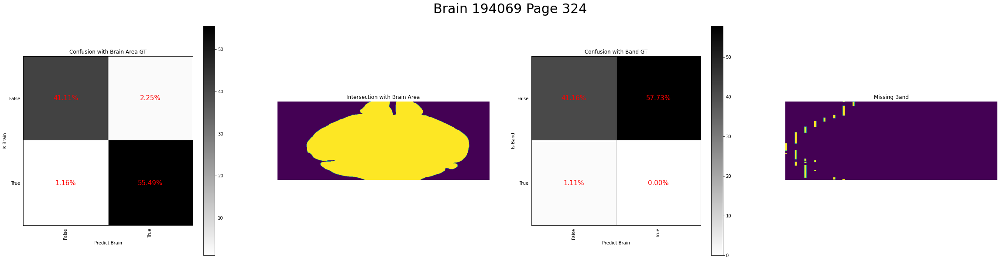

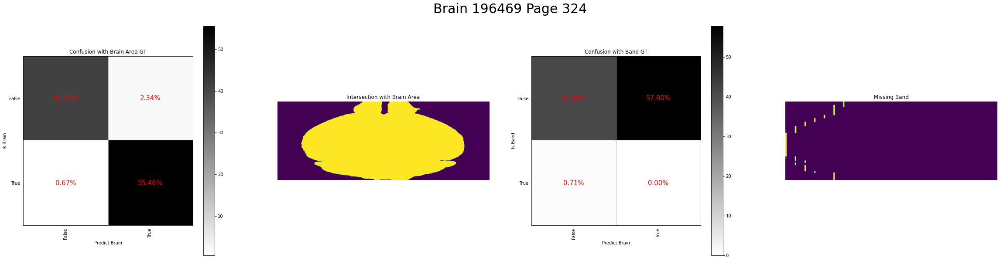

In [46]:
brain_gt_dir = '../../data/fg_gt'
band_gt_dir = '../../data/band_gt'
my_mask_dir = '../results/preprocess/morph/bandMaskStack'
eval_dir = '../results/preprocess/morph/evaluation'
os.makedirs(eval_dir, exist_ok=True)

old = ['17544', '18049', '18454', '18455', '18463']

# band miss and foreground cross list
bds = []
hits = []
fgs = []
errs = []

# per page evaluation
for brain in os.listdir(brain_gt_dir):
    id = brain.rstrip('.tif')
    if id in old:
        continue
    fg = imread(os.path.join(brain_gt_dir, brain)).astype('bool')
    bd = imread(os.path.join(band_gt_dir, brain)).astype('bool')
    my_fg= imread(os.path.join(my_mask_dir, id + '.tif')).astype('bool')
    cm_bd = confusion_matrix(bd.reshape(-1), my_fg.reshape(-1))
    cm_fg = confusion_matrix(fg.reshape(-1), my_fg.reshape(-1))
    cm_bd = cm_bd * 100 / cm_bd.sum()
    cm_fg = cm_fg * 100 / cm_fg.sum()

    # plot
    fig = plt.figure(figsize=(40, 10))
    plt.title('Brain ' + id + ' Page ' + page, {'fontsize': 30}, pad=30)
    plt.axis('off')
    fig.add_subplot(1, 4, 1)
    plot_confusion_matrix(cm_fg, [False, True], 'Predict Brain', 'Is Brain', title='Confusion with Brain Area GT')
    fig.add_subplot(1, 4, 2)
    plt.imshow(np.bitwise_and(fg, my_fg).astype('float'))
    plt.axis('off')
    plt.title('Intersection with Brain Area')
    fig.add_subplot(1, 4, 3)
    plot_confusion_matrix(cm_bd, [False, True], 'Predict Brain', 'Is Band', title='Confusion with Band GT')
    fig.add_subplot(1, 4, 4)
    plt.imshow(np.bitwise_and(bd, np.bitwise_not(my_fg)).astype('float'))
    plt.axis('off')
    plt.title('Missing Band')
    plt.savefig(os.path.join(eval_dir, brain.strip('.tif') + '.png'))

    fgs.append(cm_fg[1][0] + cm_fg[1][1])
    hits.append(cm_fg[1][1])
    bds.append(cm_bd[1][1] + cm_bd[1][0])
    errs.append(cm_bd[1][1])

Sum up.

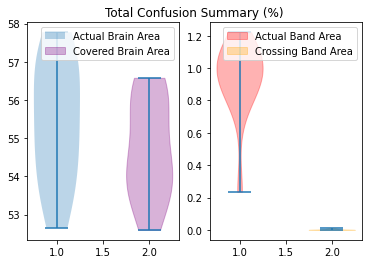

In [45]:
fig = plt.figure()
plt.title('Total Confusion Summary (%)')
plt.axis('off')
fig.add_subplot(1, 2, 1)
violin = plt.violinplot([fgs, hits])
violin['bodies'][1].set_color('purple')
plt.legend(['Actual Brain Area', 'Covered Brain Area'])
fig.add_subplot(1, 2, 2)
violin = plt.violinplot([bds, errs])
violin['bodies'][0].set_color('red')
violin['bodies'][1].set_color('orange')
plt.legend(['Actual Band Area', 'Crossing Band Area'])
plt.savefig(os.path.join(eval_dir, 'sum.png'))
plt.show()